# Sentinel-2 <img align="right" src="../Supplementary_data/DE_Africa_Logo_Stacked_RGB_small.jpg">

* **Products used:** 
[s2_l2a](https://explorer.digitalearth.africa/s2_l2a)


## Background

Sentinel-2 is an Earth observation mission from the EU Copernicus Programme that systematically acquires optical imagery at high spatial resolution (up to 10 m for some bands).
The mission is based on a constellation of two identical satellites in the same orbit, 180° apart for optimal coverage and data delivery.
Together, they cover all Earth's land surfaces, large islands, inland and coastal waters every 3-5 days.

Sentinel-2A was launched on 23 June 2015 and Sentinel-2B followed on 7 March 2017.
Both of the Sentinel-2 satellites carry an innovative wide swath high-resolution multispectral imager with 13 spectral bands.
For more information on the Sentinel-2 platforms and applications, check out the [European Space Agency website](http://www.esa.int/Applications/Observing_the_Earth/Copernicus/Overview4).

Digital Earth Africa (DE Africa) provides [Sentinel-2, Level 2A](https://earth.esa.int/web/sentinel/technical-guides/sentinel-2-msi/level-2a-processing) surface reflectance data provided by ESA.
Surface reflectance provides standardised optical datasets by using robust physical models to correct for variations in image radiance values due to atmospheric properties, as well as sun and sensor geometry.
The resulting stack of surface reflectance grids are consistent over space and time, which is instrumental in identifying and quantifying environmental change.

DE Africa provides one Sentinel-2 surface reflectance product:

* **Sentinel-2** (i.e. `"s2_l2a"`): This product represents the 'definitive' source of high quality, analysis-ready Sentinel-2 surface reflectance data (Level 2A), and is available from 2017 to present. Sentinel-2A and Sentinel-2B satellite sensors are stored together under a single product name.

Sentinel-2, Level 2A surface reflectance products have 13 spectral channels and one pixel quality band ([SCL](https://earth.esa.int/web/sentinel/technical-guides/sentinel-2-msi/level-2a/algorithm)):

| Sentinel-2 bands | DE Africa band name | Band number | Central wavelength (nm) | Resolution (m) | Bandwidth (nm) |
| -----------------|---------------|-------------|-------------------------|----------------|----------------|
| Coastal aerosol | `coastal_aerosol` | 1 | 443 | 60 | 20 |
| Blue | `blue` | 2 | 490 | 10 | 65 |
| Green | `green` | 3 | 560 | 10 | 35 |
| Red | `red` | 4 | 665 | 10 | 30 |
| Vegetation red edge | `red_edge_1` | 5 | 705 | 20 | 15 |
| Vegetation red edge | `red_edge_2` | 6 | 740 | 20 | 15 |
| Vegetation red edge | `red_edge_3` | 7 | 783 | 20 | 20 |
| NIR | `nir_1`, `nir` | 8 | 842 | 10 | 115 |
| Narrow NIR | `nir_2`,`nir_narrow` | 8A | 865 | 20 | 20 |
| Water vapour | `water_vapour` | 9 | 945 | 60 | 20 |
| SWIR | `swir_1`, `swir_16` | 11 | 1610 | 20 | 90 |
| SWIR | `swir_2`, `swir_22` | 12 | 2190 | 20 | 180 |
| SCL  | `SCL`, `qa`, `mask`    | 13 | N/A | 20
| AOT  | `aerosol_optical_thickness` | N/A | N/A | 60

These bands cover the visible, near-infrared and short-wave infrared wavelengths.

!['Sentinel-2 spectral bands'](http://www.geosage.com/highview/figures/Sentinel2_Spectral_Bands.jpg)

***

## Important details

**Product details:**
* Product name in the datacube: `"s2_l2a"`
* Surface reflectance product (Level 2A)
    * Valid SR scaling range: `1 – 10,000 (0 is no-data)`
* Spatial resolution: varies, see above table
* [SCL](https://earth.esa.int/web/sentinel/technical-guides/sentinel-2-msi/level-2a/algorithm) used as pixel quality band
* Universal Transverse Mercator (UTM) map projection. World Geodetic System (WGS) 84 datum
* Stored in Cloud-Optimised GeoTIFF Format (COG)

**Status:** 

DE Africa's Sentinel-2 data is processed to Level 2A using the [Sen2Cor](https://step.esa.int/main/third-party-plugins-2/sen2cor/) algorithm, stored as Cloud-Optimised Geotiffs, and is available over the entire African Continent. Sentinel-2A and Sentinel-2B satellite sensors are stored together under a single product name (`"s2_l2a"`). 

The catalogue is regularly updated to keep pace with new satellite passes.

**Date-range**: 

2017 to Present


**Minimum loading requirements:**
```
data = dc.load(product='s2_l2a',
               output_crs='epsg:6933',
               resolution=(-20, 20),
               **query)
```                               
**Bands:**
```
coastal_aerosol
blue           
green           
red
red_edge_1
red_edge_2
red_edge_3
nir_1
nir_2
swir_1            
swir_2
water_vapour
SCL        
AOT
```

***

## Description

This notebook will run through loading in Sentinel-2 satellite images.
Topics covered include:

* Using the native `dc.load()` function to load in Sentinel-2 data
* Using the `load_ard()` wrapper function to load in a cloud and pixel-quality masked time series

***

## Getting started

To run this analysis, run all the cells in the notebook, starting with the "Load packages" cell.

### Load packages

In [37]:
import sys
import datacube

sys.path.append('../Scripts')
from deafrica_datahandling import load_ard, mostcommon_crs
from deafrica_plotting import rgb

### Connect to the datacube

In [38]:
dc = datacube.Datacube(app='Sentinel_2')

In [66]:
# Create a query object
#lat, lon = -23.98, 28.92
#buffer = 0.08
#time = ('2020-11-07')
#figname = "Limpopo_mine_S2_20201107_truecolor.jpeg"

#lat, lon = -33.67, 19.56
#buffer = 0.08
#figname = "SA_agriculture_S2_20201111_truecolor.jpeg"
#time = ('2020-11-11')
bands = ['red', 'green', 'blue'] #, 'nir', 'swir_1']

lat, lon = 30.15, 30.41
buffer_lat, buffer_lon = 0.10, 0.15
figname = "Egypt_circles_S2_20201122_fc.jpeg"
time = ('2020-11-22') #1212
bands = ['green','red','nir','swir_1','swir_2']

lat, lon = 21.11, -11.4
buffer_lat, buffer_lon = 0.3, 0.45
figname = "Eye_of_Sahara_20210101_geology.jpeg"
time = ('2021-01-01')
bands = ['swir_2', 'swir_1','blue'] 

figname = "Eye_of_Sahara_20210101_truecolor.jpeg"
time = ('2021-01-01')
bands = ['red', 'green', 'blue']

query = {
    'time': time,
    'x': (lon - buffer_lon, lon + buffer_lon),
    'y': (lat + buffer_lat, lat - buffer_lat),
    'resolution':(-10,10),
}
output_crs = mostcommon_crs(dc=dc, product='s2_l2a', query=query)


../Scripts/deafrica_datahandling.py:643: UserWarning: Multiple UTM zones ['epsg:32629', 'epsg:32628'] were returned for this query. Defaulting to the most common zone: epsg:32629
  UserWarning)


In [67]:

ds = load_ard(dc=dc,
              products=['s2_l2a'], measurements=bands,
              output_crs=output_crs, group_by='solar_day',
              mask_pixel_quality= False,
              **query)

Using pixel quality parameters for Sentinel 2
Finding datasets
    s2_l2a
Loading 1 time steps


In [68]:
from fc.fractional_cover import compute_fractions
import xarray as xr

# define function to compute fractional cover and return a datarray
def compute_fc(input_da, regression_coefficients = None):
    """
    Compute fractional cover from an input data array.
    
    Parameters
    ---------- 
    input_da: xr.DataArray
        A 3-dimensional dataArray with the first dimension being spectral bands
    
    regression_coefficients: dict, optional
        A dictionary containing linear regression coefficients to transform the input spectral bands
        e.g. {'green':[31, 1.0582],
              'red':[64, 0.9871],
              'nir':[120, 1.0187],
              'swir1':[79, 0.9528],
              'swir2':[-42, 0.9688]}

    Returns
    -------
    A 3-dimensional xr.DataArray with the first dimension containing the FC components.  
    """
    # prepare input data
    is_valid_array= (input_da >0).all(dim=input_da.dims[0])
    input_da = input_da.where(is_valid_array, 0)
    # define output coordinates
    output_coords = {'variable': ['PV', 'NPV', 'BS', 'UE']}
    output_dims = ['variable']
    for dim in input_da.dims[1:]:
        output_coords[dim] = input_da.coords[dim]
        output_dims.append(dim)
    # calculate FC
    output = compute_fractions(input_da, regression_coefficients = regression_coefficients)
    # nodata value is -1
    return xr.DataArray(output, coords=output_coords, dims=output_dims).where(is_valid_array, -1)

In [42]:
regression_coefficients = {'green':[31, 1.0582],
              'red':[64, 0.9871],
              'nir':[120, 1.0187],
              'swir1':[79, 0.9528],
              'swir2':[-42, 0.9688]}
s2_fc = ds.to_array(dim='band').groupby('time').apply(compute_fc, regression_coefficients=regression_coefficients).to_dataset(dim='variable')

In [43]:
s2_fc

<xarray.Dataset>
Dimensions:      (time: 1, x: 2942, y: 2284)
Coordinates:
  * y            (y) float64 3.35e+06 3.35e+06 3.35e+06 ... 3.327e+06 3.327e+06
  * x            (x) float64 2.358e+05 2.358e+05 ... 2.652e+05 2.652e+05
  * time         (time) datetime64[ns] 2020-11-22T08:51:52
    spatial_ref  int32 32636
Data variables:
    PV           (time, y, x) int8 31 24 23 21 27 28 26 25 ... 4 4 5 4 5 6 5 6
    NPV          (time, y, x) int8 11 8 8 12 2 1 4 7 8 12 ... 0 0 0 0 0 0 0 0 0
    BS           (time, y, x) int8 57 66 67 66 70 70 69 ... 95 95 95 95 93 95 94
    UE           (time, y, x) int8 7 6 5 5 5 5 5 5 5 6 6 ... 3 3 3 3 3 3 3 3 3 3

Exporting image to Egypt_circles_S2_20201122_fc.jpeg


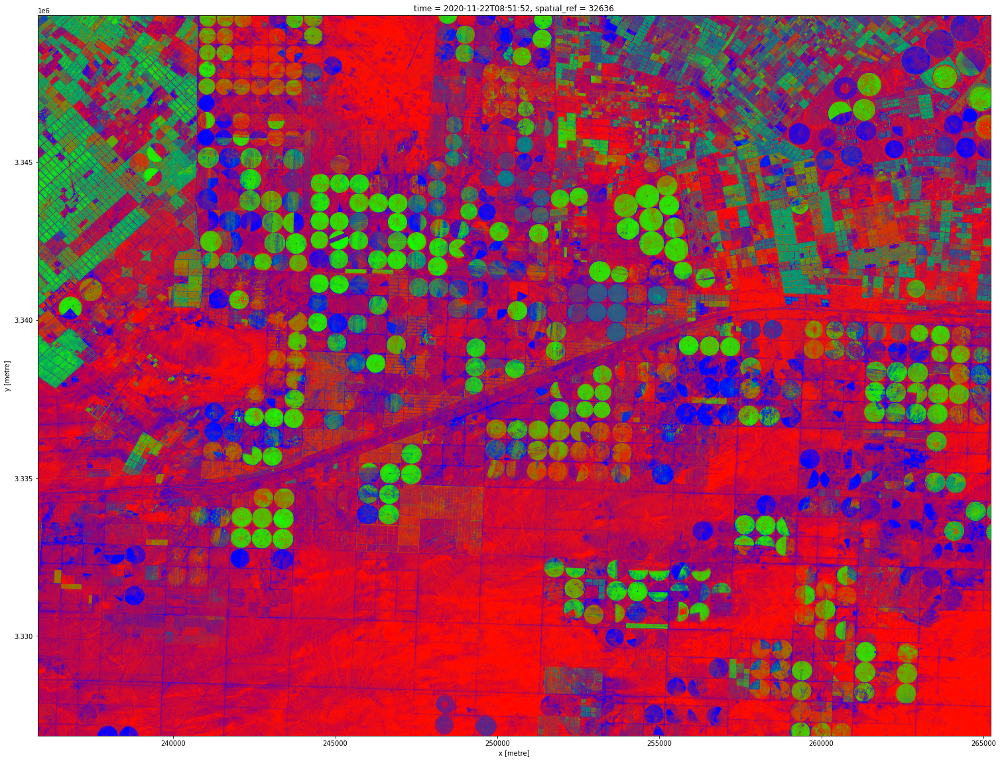

In [44]:
rgb(s2_fc.squeeze(), bands=['BS', 'PV', 'NPV'], size=20, percentile_stretch = [0.01, 0.99],
    savefig_path = figname, savefig_kwargs = {"optimize":True, "dpi":300})

In [69]:
ds

<xarray.Dataset>
Dimensions:      (time: 1, x: 9454, y: 6787)
Coordinates:
  * time         (time) datetime64[ns] 2021-01-01T11:25:33
  * y            (y) float64 2.37e+06 2.37e+06 2.37e+06 ... 2.302e+06 2.302e+06
  * x            (x) float64 2.033e+05 2.033e+05 ... 2.979e+05 2.979e+05
    spatial_ref  int32 32629
Data variables:
    red          (time, y, x) uint16 6016 5864 5372 4804 ... 5004 4948 4868 4896
    green        (time, y, x) uint16 3872 3812 3466 3022 ... 3204 3022 2900 2884
    blue         (time, y, x) uint16 2246 2120 1950 1724 ... 1772 1582 1528 1486
Attributes:
    crs:           epsg:32629
    grid_mapping:  spatial_ref

Once the load is complete, we can then analyse or plot the Sentinel-2 data. As you can see below, clouds and regions of no-data are visible.

Exporting image to Eye_of_Sahara_20210101_truecolor.jpeg


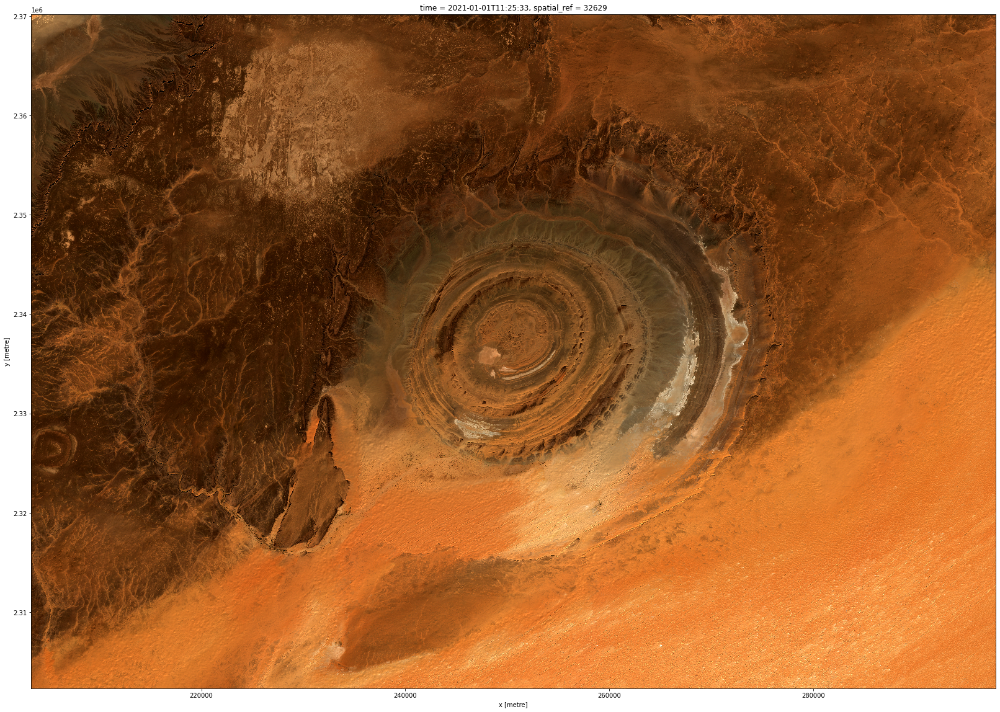

In [70]:
rgb(ds.squeeze(), bands=bands, size=20, percentile_stretch = [0.01, 0.99],
    savefig_path = figname, savefig_kwargs = {"optimize":True, "dpi":300})

***

## Additional information

**License:** The code in this notebook is licensed under the [Apache License, Version 2.0](https://www.apache.org/licenses/LICENSE-2.0). 
Digital Earth Africa data is licensed under the [Creative Commons by Attribution 4.0](https://creativecommons.org/licenses/by/4.0/) license.

**Contact:** If you need assistance, please post a question on the [Open Data Cube Slack channel](http://slack.opendatacube.org/) or on the [GIS Stack Exchange](https://gis.stackexchange.com/questions/ask?tags=open-data-cube) using the `open-data-cube` tag (you can view previously asked questions [here](https://gis.stackexchange.com/questions/tagged/open-data-cube)).
If you would like to report an issue with this notebook, you can file one on [Github](https://github.com/digitalearthafrica/deafrica-sandbox-notebooks).

**Last modified:** June 2020

**Compatible datacube version:** 

In [9]:
print(datacube.__version__)

1.8.0b7.dev35+g5023dada


## Tags
Browse all available tags on the DE Africa User Guide's [Tags Index]()